## Part I : Global includes



In [46]:

%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import os
import pathlib
from matplotlib import pyplot as plt
import torch
import numpy as np
import cv2
import tensorflow as tf
from pyemd.EMD2d import EMD2D
emd2d = EMD2D()

# Uncomment to disable GPU usage.
# This is required for some models like Pridnet which has too many traininable parameters
tf.config.set_visible_devices([], 'GPU')

from tqdm.notebook import tqdm
import random

import data_importer

In [47]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

## Part II : Loading test images

In [48]:
#from sklearn.model_selection import train_test_split
from data_importer import load_training_images

noisy_array, gt_array = load_training_images('../../../../Dataset/LowDoseCTGrandChallenge/Training_Image_Data/', load_limited_images=True, num_images_to_load=1)

_n, _g = load_training_images('../../../../Dataset/LowDoseCTGrandChallenge/Selected_Image_Pairs/', load_limited_images=False, num_images_to_load=1)

noisy_array = np.concatenate((noisy_array, _n), axis=0)
gt_array = np.concatenate((gt_array, _g), axis=0)

extended_noisy_array, extended_gt_array = load_training_images('../../../../Dataset/LowDoseCTGrandChallenge/Training_Image_Data/', load_limited_images=True, num_images_to_load=1)

loaded training images x and y of len :  1 1  respectively
type of train images x :  float64
range of values in train images :  0.0 0.576171875
type of train images y :  float64
loaded training images x and y of len :  3 3  respectively
type of train images x :  float64
range of values in train images :  0.0 0.654541015625
type of train images y :  float64
loaded training images x and y of len :  1 1  respectively
type of train images x :  float64
range of values in train images :  0.0 0.576171875
type of train images y :  float64


Visualization of the noisy / ground truth image pair

In [49]:
from data_importer import denormalize, trunc

for i in range(6, 0, 3):
    f, axarr = plt.subplots(1,2, figsize=(14,14))
    axarr[0].imshow(trunc(denormalize(noisy_array[i])), vmin=-160.0, vmax=240.0, cmap='gray')
    axarr[0].set_title("Noisy image (QD)")
    axarr[1].imshow(trunc(denormalize(gt_array[i])), vmin=-160.0, vmax=240.0, cmap='gray')
    axarr[1].title.set_text("Ground Truth image (FD)")
    plt.show()

### Part III : Setup for Inference

In [50]:
# Inference
def inference_single_image(model, noisy_image):
    input_image = np.expand_dims(noisy_image, axis=0)
    predicted_image = model.predict(input_image)
    a = np.abs(np.min(predicted_image))
    b = np.max(predicted_image)
    
    #predicted_image = predicted_image * (b - a) + a
    return predicted_image[0]

def inference_batch_images(model, noisy_images):
    input_image = noisy_images

    predicted_image = model.predict(input_image).astype(np.float64)
    return predicted_image

In [51]:
def rgb2gray(rgb):
    return np.expand_dims(np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140]), axis=-1)

from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio
import sys
sys.path.append('../')

from metrics import compute_SSIM, compute_PSNR
from skimage.metrics import mean_squared_error  as mse

def calculate_psnr(original_image, reconstructed_image,range=400):
    return peak_signal_noise_ratio(original_image, reconstructed_image,data_range=range) 

    psnr_value = peak_signal_noise_ratio(original_image, reconstructed_image, data_range=240+160)
    return psnr_value

def calculate_ssim(original_image, reconstructed_image, range=400.0):    
    ssim_value = ssim(original_image.astype(np.int16), reconstructed_image.astype(np.int16), win_size=11, channel_axis=2, data_range=range)
    return ssim_value

def calculate_rmse(original_image, reconstructed_image):
    return mse(original_image, reconstructed_image)

def visualize_predictions(model, X_test, y_test, n, predictions, model_name):
    random_numbers = list(range(n)) # not very random
    for i in random_numbers:
        noisy_image = X_test[i].astype(np.float16)
        gt_image = y_test[i].astype(np.float16)
        predicted_image = predictions[i].astype(np.float16)

        if predicted_image.shape[-1] == 3:
            predicted_image = rgb2gray(predicted_image)
                                
            
        psnr_recon =  calculate_psnr(trunc(denormalize(gt_image)), trunc(denormalize(predicted_image)))
        psnr_qd =  calculate_psnr(trunc(denormalize(gt_image)),  trunc(denormalize(noisy_image)))
        ssim_recon = calculate_ssim(trunc(denormalize(gt_image)),  trunc(denormalize(predicted_image)))
        ssim_qd =calculate_ssim(trunc(denormalize(gt_image)), trunc(denormalize(noisy_image)))
        rmse_recon = calculate_rmse(trunc(denormalize(gt_image)),  trunc(denormalize(predicted_image)))
        rmse_qd=calculate_rmse(trunc(denormalize(gt_image)), trunc(denormalize(noisy_image)))
        
        psnr_recon = round(psnr_recon, 4)
        psnr_qd = round(psnr_qd, 4)
        ssim_recon = round(ssim_recon, 4)
        ssim_qd = round(ssim_qd, 4)
        rmse_recon = round(rmse_recon, 4)
        rmse_qd = round(rmse_qd, 4)
        
        f, axarr = plt.subplots(1,3, figsize=(21,21))

        axarr[0].imshow(trunc(denormalize(noisy_image)), cmap='gray', vmin=-160.0, vmax=240.0)
        axarr[0].set_title("QD Image : PSNR={}\nSSIM={}\nRMSE={}".format(psnr_qd, ssim_qd, rmse_qd))
        axarr[0].set_axis_off()
        axarr[1].imshow(trunc(denormalize(gt_image)),  cmap='gray', vmin=-160.0, vmax=240.0)
        axarr[1].set_title("FD Image")
        axarr[1].set_axis_off()
        axarr[2].imshow(trunc(denormalize(predicted_image)), cmap='gray', vmin=-160.0, vmax=240.0)
        axarr[2].set_title("{} Predicted Image : PSNR={}\nSSIM={}\nRMSE={}".format(model_name, psnr_recon, ssim_recon, rmse_recon))
        axarr[2].set_axis_off()
        
        plt.show()

In [52]:
from skimage.metrics import peak_signal_noise_ratio

def get_average_metrics(predicted_images, _gt_array, _noisy_array):
    psnr_original_mean = 0
    psnr_prediction_mean = 0

    ssim_original_mean = 0
    ssim_prediction_mean = 0

    mse_original_mean = 0
    mse_prediction_mean = 0

    if np.all(_gt_array) != None:
        gt_array = _gt_array
        noisy_array = _noisy_array
        

    i = 0
    for gt_img, noisy_img, predicted_img in zip(gt_array, noisy_array, predicted_images):
        predicted_img=  predicted_images[i]
        if predicted_img.shape[-1] == 3:
            predicted_img = rgb2gray(predicted_img)
            
        psnr_recon =  calculate_psnr(trunc(denormalize(gt_img)), trunc(denormalize(predicted_img)))
        psnr_qd =  calculate_psnr(trunc(denormalize(gt_img)),  trunc(denormalize(noisy_img)))
        ssim_recon = calculate_ssim(trunc(denormalize(gt_img)),  trunc(denormalize(predicted_img)))
        ssim_qd =calculate_ssim(trunc(denormalize(gt_img)), trunc(denormalize(noisy_img)))
        rmse_recon = calculate_rmse(trunc(denormalize(gt_img)),  trunc(denormalize(predicted_img)))
        rmse_qd=calculate_rmse(trunc(denormalize(gt_img)), trunc(denormalize(noisy_img)))

        psnr_original_mean += psnr_qd
        psnr_prediction_mean += psnr_recon
        
        ssim_original_mean += ssim_qd
        ssim_prediction_mean += ssim_recon

        mse_original_mean += rmse_qd
        mse_prediction_mean += rmse_recon
        
        i = i + 1        
    
    psnr_original_mean/=gt_array.shape[0]
    psnr_prediction_mean/=gt_array.shape[0]

    ssim_original_mean/=gt_array.shape[0]
    ssim_prediction_mean/=gt_array.shape[0]

    mse_original_mean/=gt_array.shape[0]
    mse_prediction_mean/=gt_array.shape[0]
    
    print("Original average gt-noisy PSNR ->", psnr_original_mean)
    print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

    print("Original average gt-noisy SSIM ->", ssim_original_mean)
    print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)

    print("Original average gt-noisy MSE->", mse_original_mean)
    print("Predicted average gt-predicted MSE->", mse_prediction_mean)
    
    return round(psnr_prediction_mean, 4), round(ssim_prediction_mean, 4), round(mse_prediction_mean, 4), round(psnr_prediction_mean - psnr_original_mean, 4), round(ssim_prediction_mean - ssim_original_mean, 4), round(mse_prediction_mean - mse_original_mean, 4)


## Part IV : Evaluation of each model

## Model 1 : Hformer (for base reference)

In [53]:
sys.path.append('../denoising-models/hformer_vit/model/')
sys.path.append('../denoising-models/hformer_vit/')
from hformer_model_extended import get_hformer_model, PatchExtractor

hformer_model = get_hformer_model(num_channels_to_be_generated=64, name="hformer_model_extended")
hformer_model.build(input_shape=(None, 64, 64, 1))
hformer_model.load_weights('../denoising-models/hformer_vit/test/experiments/full_dataset/hformer_64_channel_custom_loss_epochs_48.h5')
print('Model summary : ')
print(hformer_model.summary())

Model summary : 
Model: "hformer_model_extended"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_projection_layer (Inp  multiple                 320       
 utProjectionLayer)                                              
                                                                 
 output_projection_layer (Ou  multiple                 257       
 tputProjectionLayer)                                            
                                                                 
 conv_net_block_1 (Convoluti  multiple                 36416     
 onBlock)                                                        
                                                                 
 conv_net_block_2 (Convoluti  multiple                 36416     
 onBlock)                                                        
                                                                 
 downsampling_layer_1 (Conv

In [54]:
def reconstruct_image_from_patches(patches, num_patches_per_row):
    patch_size = patches.shape[1]  # Assuming square patches
    num_patches = patches.shape[0]

    # Calculate the number of rows
    num_patches_per_col = num_patches // num_patches_per_row

    # Initialize an empty image to store the reconstructed result
    reconstructed_image = np.zeros((num_patches_per_col * patch_size, num_patches_per_row * patch_size))

    # Reshape the patches into a 2D array
    patches_2d = patches.reshape((num_patches_per_col, num_patches_per_row, patch_size, patch_size))
    # Reconstruct the image by placing each patch in its corresponding position

    for i in range(num_patches_per_col):
        for j in range(num_patches_per_row):
            reconstructed_image[i * patch_size:(i + 1) * patch_size, j * patch_size:(j + 1) * patch_size] = patches_2d[i, j]

    return np.expand_dims(reconstructed_image, axis=-1)

In [55]:
# View the predictions
patch_extractor = PatchExtractor(patch_size=64, stride=64, name="patch_extractor")
noisy_image_patches_array = patch_extractor(noisy_array)
extended_noisy_image_patches_array = patch_extractor(extended_noisy_array)


2/2 [==============================] - 2s 810ms/step


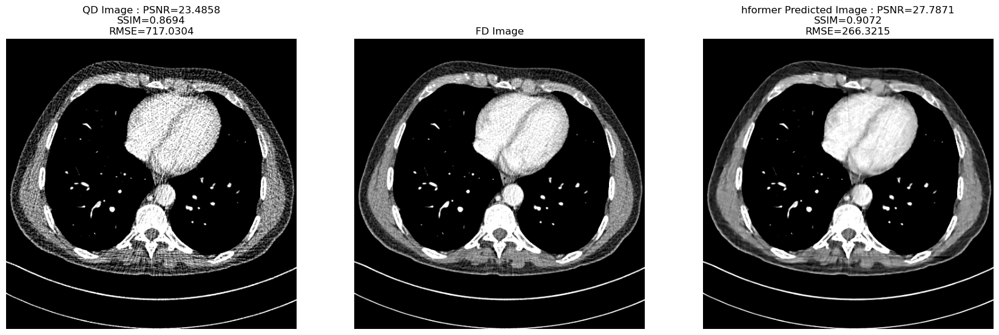

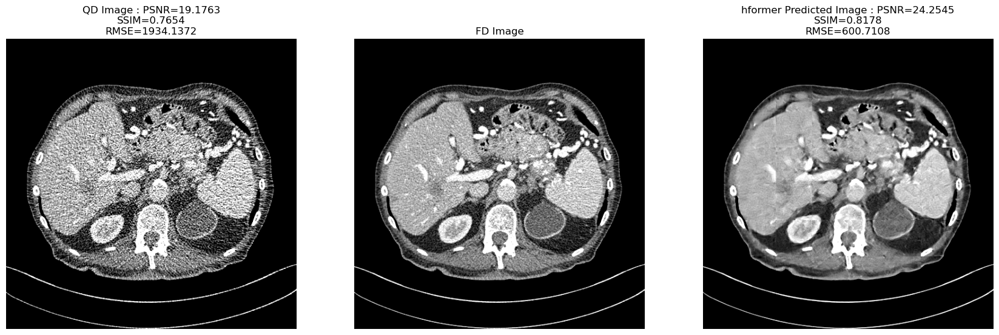

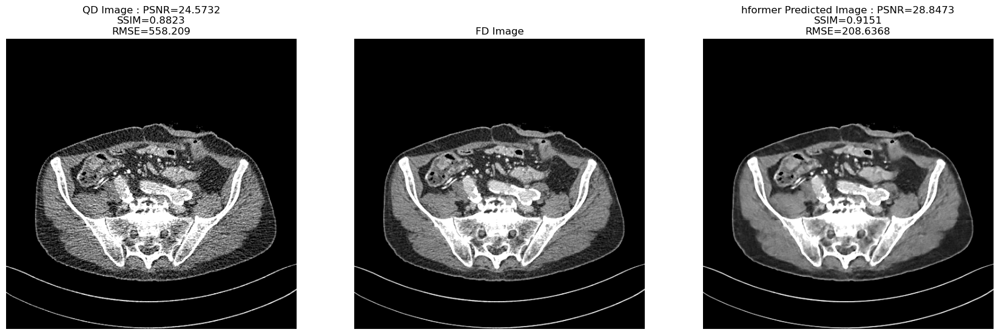

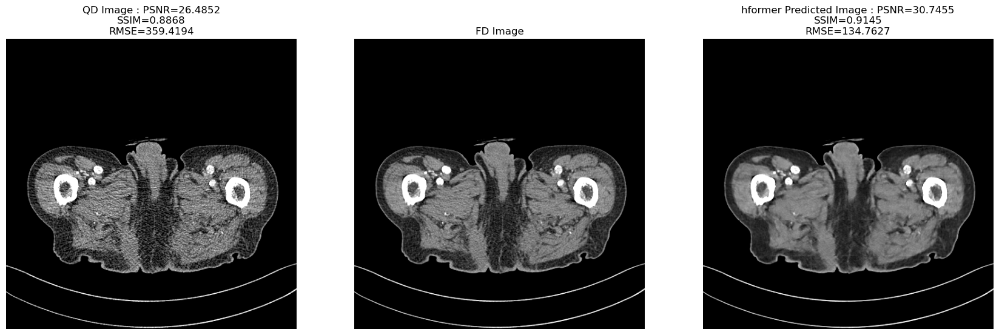

In [56]:

hformer_prediction_patches = hformer_model.predict(noisy_image_patches_array)
extended_hformer_prediction_patches = hformer_model.predict(extended_noisy_image_patches_array)

hformer_predictions = np.expand_dims(reconstruct_image_from_patches(hformer_prediction_patches[0:64], 8), axis=0)
extended_hformer_predictions = np.expand_dims(reconstruct_image_from_patches(extended_hformer_prediction_patches[0:64], 8), axis=0)

for i in range(1, int(hformer_prediction_patches.shape[0] / 64)): 
    reconstructed_image = reconstruct_image_from_patches(hformer_prediction_patches[i * 64 : i * 64 + 64], num_patches_per_row=8)
    reconstructed_image = np.expand_dims(reconstructed_image, axis=0)

    hformer_predictions = np.append(hformer_predictions, reconstructed_image, axis=0)

for i in range(1, int(extended_hformer_prediction_patches.shape[0] / 64)): 
    extended_reconstructed_image = reconstruct_image_from_patches(extended_hformer_prediction_patches[i * 64 : i * 64 + 64], num_patches_per_row=8)
    extended_reconstructed_image = np.expand_dims(extended_reconstructed_image, axis=0)

    extended_hformer_predictions = np.append(extended_hformer_predictions, extended_reconstructed_image, axis=0)
visualize_predictions(hformer_predictions, noisy_array, gt_array, len(gt_array), hformer_predictions, "hformer")

In [57]:
extended_hformer_metrics = get_average_metrics(extended_hformer_predictions, extended_gt_array, extended_noisy_array)
extended_hformer_metrics 

Original average gt-noisy PSNR -> 23.485824280503806
Predicted average gt-predicted PSNR -> 27.7871448164767
Original average gt-noisy SSIM -> 0.8693725347221538
Predicted average gt-predicted SSIM -> 0.9071239842451638
Original average gt-noisy MSE-> 717.0303764343262
Predicted average gt-predicted MSE-> 266.3210540488661


(27.7871, 0.9071, 266.3211, 4.3013, 0.0378, -450.7093)

## Model 2 : XModel B

In [58]:
from torchinfo import summary
sys.path.append('../denoising-models/novel_model/')
from xb_denoiser_with_hf_conv import XModel 
x_model = XModel(num_channels=1)
x_model.load_state_dict(torch.load('../denoising-models/novel_model_weights/xb_hf_model_889.pth'))
x_model.eval()
print('Model summary : ')
print(summary(x_model))


Model summary : 
Layer (type:depth-idx)                        Param #
XModel                                        --
├─ConvTranspose2d: 1-1                        5
├─Conv2d: 1-2                                 5
├─InputProjectionLayer: 1-3                   --
├─OutputProjectionLayer: 1-4                  --
├─ConvBlock: 1-5                              --
│    └─ZeroPad2d: 2-1                         --
│    └─DepthWiseSeparableConv2d: 2-2          --
│    │    └─Conv2d: 3-1                       49
│    │    └─Conv2d: 3-2                       1
│    └─LayerNorm: 2-3                         --
│    └─Conv2d: 2-4                            200
│    └─GELU: 2-5                              --
│    └─Conv2d: 2-6                            5
├─ConvBlock: 1-6                              --
│    └─ZeroPad2d: 2-7                         --
│    └─DepthWiseSeparableConv2d: 2-8          --
│    │    └─Conv2d: 3-3                       49
│    │    └─Conv2d: 3-4                       1
│ 

torch.Size([1, 512, 512, 1])
torch.Size([1, 512, 512, 1])
torch.Size([1, 512, 512, 1])
torch.Size([1, 512, 512, 1])
torch.Size([1, 512, 512, 1])


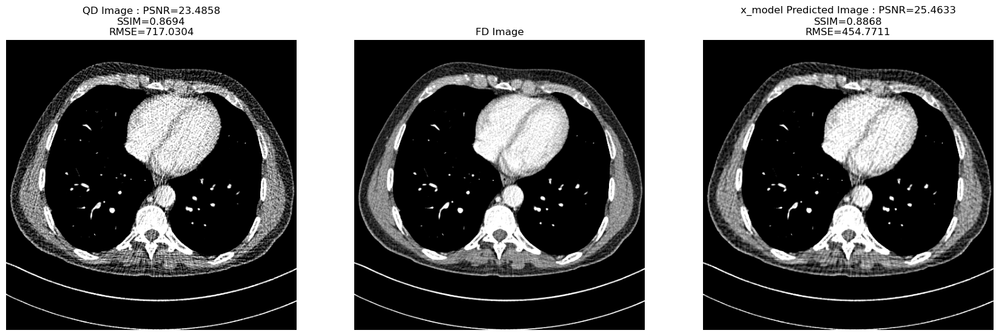

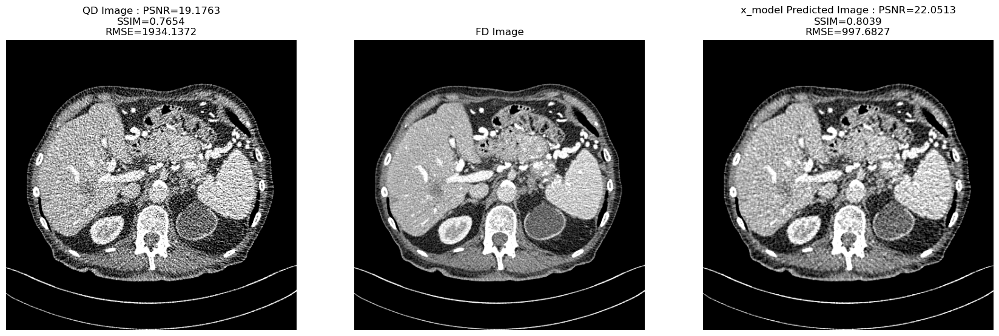

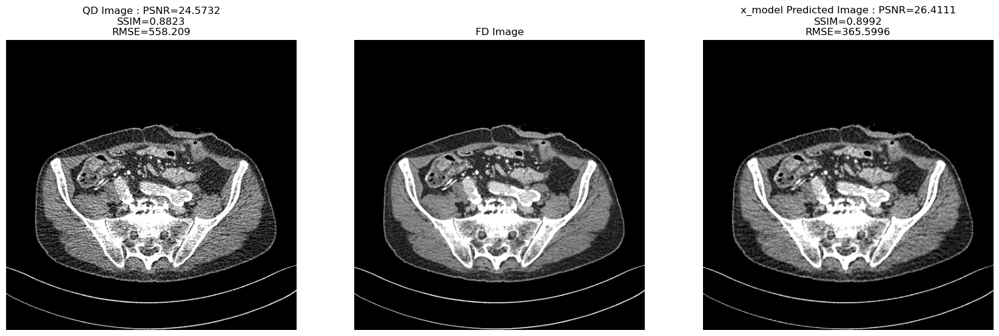

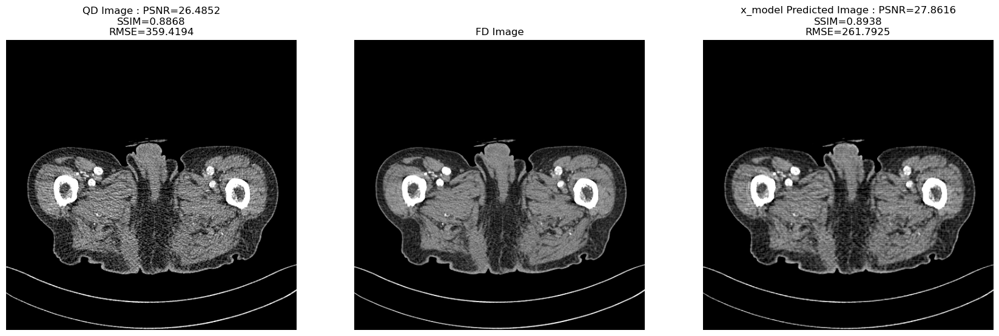

In [59]:
# Get prediction images.

x_model_prediction_patches = []
extended_x_model_prediction_patches = []

for img in noisy_array:
    img_tensor = torch.unsqueeze(torch.from_numpy(img).float(), 0)

    with torch.no_grad():
        output_tensor = x_model(img_tensor)
        output_tensor = output_tensor.cpu().numpy()

        x_model_prediction_patches.append(output_tensor)
    
for img in extended_noisy_array:
    img_tensor = torch.unsqueeze(torch.from_numpy(img).float(), 0)

    with torch.no_grad():
        output_tensor = x_model(img_tensor)
        output_tensor = output_tensor.cpu().numpy()

        
        noisy_reshaped = img_tensor.detach().cpu().numpy()
        noisy_reshaped = np.squeeze(noisy_reshaped, axis=-1)
        noisy_reshaped = np.squeeze(noisy_reshaped, axis=0)
        noisy_imfs = emd2d.emd(noisy_reshaped,max_imf=-1)

        pred_reshaped = output_tensor
        pred_reshaped = np.squeeze(pred_reshaped, axis=-1)
        pred_reshaped = np.squeeze(pred_reshaped, axis=0)
        pred_imfs = emd2d.emd(pred_reshaped, max_imf=-1)

        

        x = 0.5
        swaped_IMFs = np.array([noisy_imfs[1] * x + pred_imfs[1] * (1.0 - x), pred_imfs[0] * (1.0 - x) + noisy_imfs[0] * x])
        predictions = torch.from_numpy(np.expand_dims(np.expand_dims(np.sum(swaped_IMFs, axis=0), -1), 0))

        extended_x_model_prediction_patches.append(predictions)

visualize_predictions(x_model, noisy_array, gt_array, len(gt_array), np.concatenate(x_model_prediction_patches,axis=0), "x_model")

In [60]:

extended_x_metrics= get_average_metrics(np.concatenate(extended_x_model_prediction_patches, axis=0), extended_gt_array, extended_noisy_array)
extended_x_metrics

Original average gt-noisy PSNR -> 23.485824280503806
Predicted average gt-predicted PSNR -> 24.88898652213459
Original average gt-noisy SSIM -> 0.8693725347221538
Predicted average gt-predicted SSIM -> 0.884482545301217
Original average gt-noisy MSE-> 717.0303764343262
Predicted average gt-predicted MSE-> 519.0645035065658


(24.889, 0.8845, 519.0645, 1.4032, 0.0151, -197.9659)

## Model 3 : Y model B

In [61]:
sys.path.append('../denoising-models/mwcnn/')
from yb_denoiser import YModel
y_model = YModel(num_channels=4)
y_model.load_state_dict(torch.load('../denoising-models/novel_model_weights/yb_model_203.pth'))
y_model.eval()
print('Model summary : ')
print(summary(y_model))

Model summary : 
Layer (type:depth-idx)                        Param #
YModel                                        --
├─InputProjectionLayer: 1-1                   --
│    └─Conv2d: 2-1                            40
├─OutputProjectionLayer: 1-2                  --
│    └─ConvTranspose2d: 2-2                   37
├─ConvBlock: 1-3                              --
│    └─ZeroPad2d: 2-3                         --
│    └─DepthWiseSeparableConv2d: 2-4          --
│    │    └─Conv2d: 3-1                       196
│    │    └─Conv2d: 3-2                       16
│    └─LayerNorm: 2-5                         --
│    └─Conv2d: 2-6                            3,152
│    └─GELU: 2-7                              --
│    └─Conv2d: 2-8                            68
├─YBlock: 1-4                                 --
│    └─Linear: 2-9                            20
│    └─Linear: 2-10                           20
│    └─Linear: 2-11                           20
│    └─Conv2d: 2-12                        

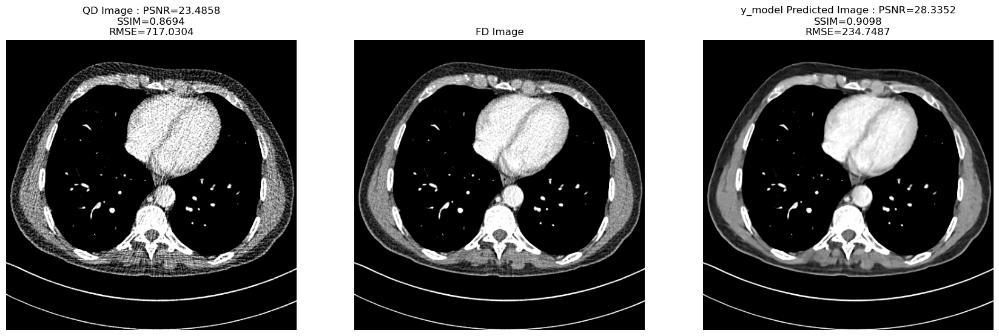

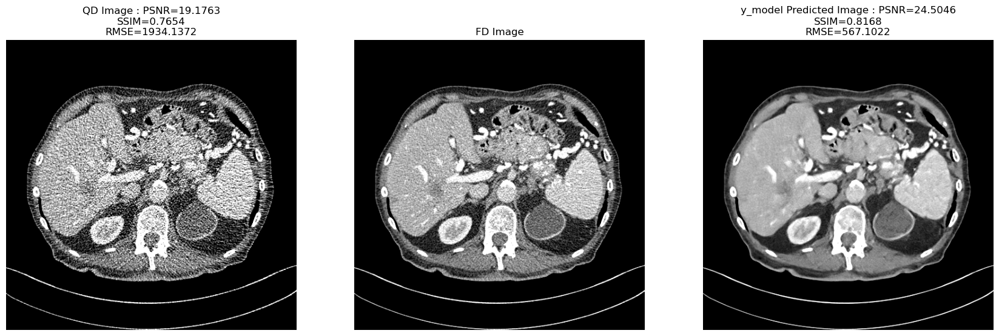

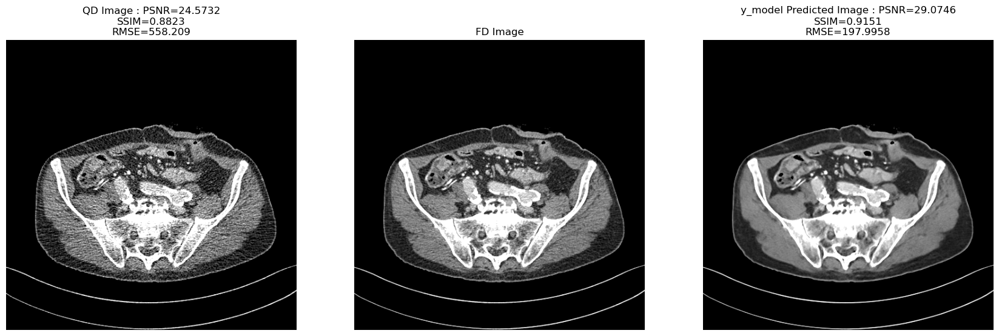

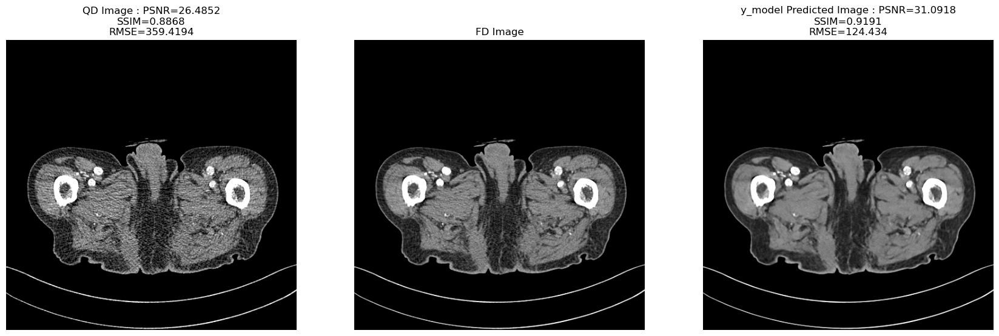

In [62]:
# Get prediction images.

y_model_prediction_patches = []
extended_y_model_prediction_patches = []

for img in noisy_array:
    img_tensor = torch.unsqueeze(torch.from_numpy(img).float(), dim=0)

    
    with torch.no_grad():
        output_tensor = y_model(img_tensor)
        output_tensor = output_tensor.cpu().numpy()

        y_model_prediction_patches.append(output_tensor)
    
   
for img in extended_noisy_array:
    img_tensor = torch.unsqueeze(torch.from_numpy(img).float(), 0)

    with torch.no_grad():
        output_tensor = y_model(img_tensor)
        output_tensor = output_tensor.cpu().numpy()

        
        noisy_reshaped = img_tensor.detach().cpu().numpy()
        noisy_reshaped = np.squeeze(noisy_reshaped, axis=-1)
        noisy_reshaped = np.squeeze(noisy_reshaped, axis=0)
        noisy_imfs = emd2d.emd(noisy_reshaped,max_imf=-1)

        pred_reshaped = output_tensor
        pred_reshaped = np.squeeze(pred_reshaped, axis=-1)
        pred_reshaped = np.squeeze(pred_reshaped, axis=0)
        pred_imfs = emd2d.emd(pred_reshaped, max_imf=-1)

        

        x = 0.5
        swaped_IMFs = np.array([noisy_imfs[1] * x + pred_imfs[1] * (1.0 - x), pred_imfs[0] * (1.0 - x) + noisy_imfs[0] * x])
        predictions = torch.from_numpy(np.expand_dims(np.expand_dims(np.sum(swaped_IMFs, axis=0), -1), 0))

        extended_y_model_prediction_patches.append(predictions)
    

visualize_predictions(y_model, noisy_array, gt_array, len(gt_array), np.concatenate(y_model_prediction_patches,axis=0), "y_model")

In [63]:

extended_y_metrics= get_average_metrics(np.concatenate(extended_y_model_prediction_patches, axis=0), extended_gt_array, extended_noisy_array)
extended_y_metrics

Original average gt-noisy PSNR -> 23.485824280503806
Predicted average gt-predicted PSNR -> 26.480193899948567
Original average gt-noisy SSIM -> 0.8693725347221538
Predicted average gt-predicted SSIM -> 0.9007429552968621
Original average gt-noisy MSE-> 717.0303764343262
Predicted average gt-predicted MSE-> 359.83267108511427


(26.4802, 0.9007, 359.8327, 2.9944, 0.0314, -357.1977)

# Model 3 : SAB Model

In [64]:

sys.path.append('../denoising-models/hformer_self_attention')
from torchinfo import summary


from sa_b_model import SABModel

sa_model = SABModel(num_channels=4).cuda()
sa_model.load_state_dict(torch.load('../denoising-models/novel_model_weights/sab_model_333.pth'))
sa_model.eval()
print('model summary\n', summary(sa_model, input_size=(64, 64, 64, 1)))


model summary
Layer (type:depth-idx)                        Output Shape              Param #
SABModel                                      [64, 64, 64, 1]           --
├─InputProjectionLayer: 1-1                   [64, 4, 64, 64]           --
│    └─Conv2d: 2-1                            [64, 4, 64, 64]           40
├─ConvBlock: 1-2                              [64, 4, 64, 64]           --
│    └─ZeroPad2d: 2-2                         [64, 4, 18, 18]           --
│    └─DepthWiseSeparableConv2d: 2-3          [64, 4, 18, 18]           --
│    │    └─Conv2d: 3-1                       [64, 4, 18, 18]           196
│    │    └─Conv2d: 3-2                       [64, 4, 18, 18]           16
│    └─Conv2d: 2-4                            [64, 16, 12, 12]          3,152
│    └─GELU: 2-5                              [64, 16, 12, 12]          --
│    └─Conv2d: 2-6                            [64, 4, 12, 12]           68
│    └─ZeroPad2d: 2-7                         [64, 4, 18, 18]           --
│ 

In [65]:

sa_prediction_patches = []
extended_sa_prediction_patches = []

with torch.no_grad():    
    for i, data in enumerate(noisy_image_patches_array):
        noisy = data
    
        predictions = sa_model(torch.unsqueeze(torch.from_numpy(noisy.numpy()), dim=0).to('cuda')).cpu()

        sa_prediction_patches.append(predictions.detach().cpu())
    
sa_prediction_patches = np.concatenate(sa_prediction_patches, axis=0)
sa_predictions = np.expand_dims(reconstruct_image_from_patches(sa_prediction_patches[0:64], 8), axis=0)


for i in range(1, int(sa_prediction_patches.shape[0] / 64)): 
    reconstructed_image = reconstruct_image_from_patches(sa_prediction_patches[i * 64 : i * 64 + 64], num_patches_per_row=8)
    reconstructed_image = np.expand_dims(reconstructed_image, axis=0)

    sa_predictions= np.append(sa_predictions, reconstructed_image, axis=0)


with torch.no_grad():    
    for i, data in enumerate(extended_noisy_image_patches_array):
        noisy = data
    
        predictions = sa_model(torch.unsqueeze(torch.from_numpy(noisy.numpy()), dim=0).to('cuda')).cpu()

        extended_sa_prediction_patches.append(predictions.detach().cpu())
    
extended_sa_prediction_patches = np.concatenate(extended_sa_prediction_patches, axis=0)
extended_sa_predictions = np.expand_dims(reconstruct_image_from_patches(extended_sa_prediction_patches[0:64], 8), axis=0)



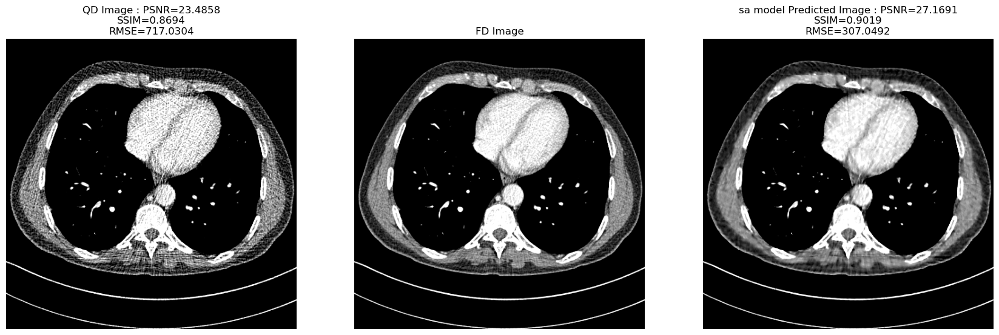

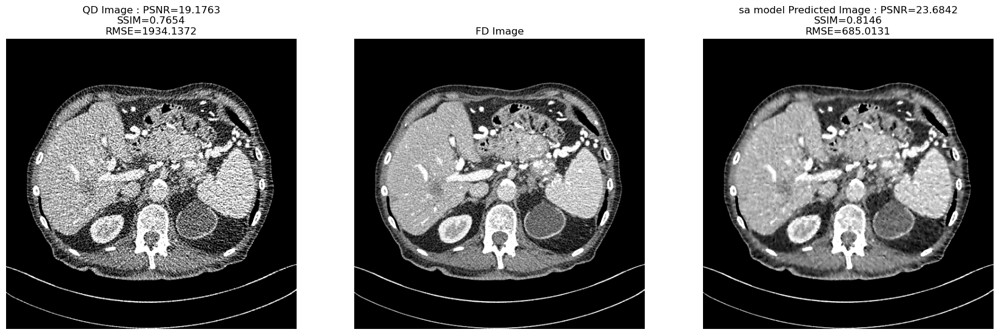

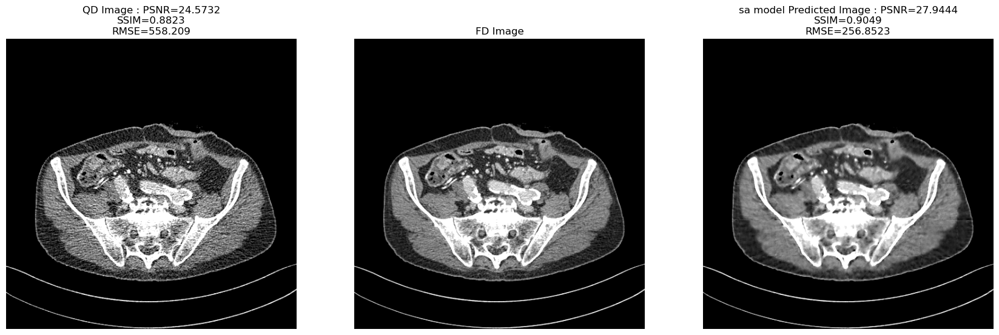

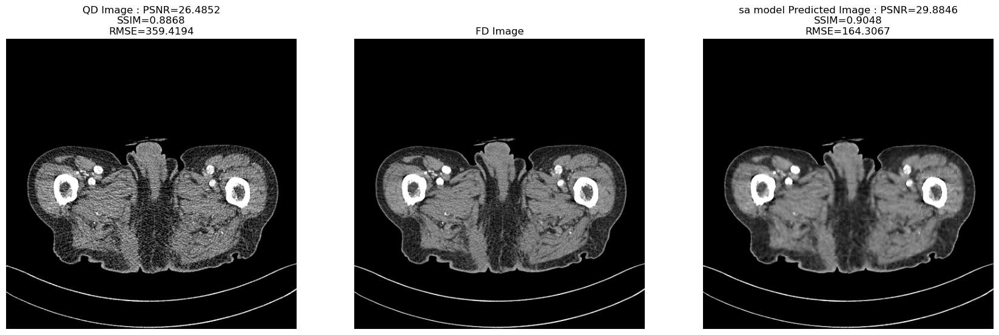

In [66]:

for i in range(1, int(extended_sa_prediction_patches.shape[0] / 64)): 
    reconstructed_image = reconstruct_image_from_patches(extended_sa_prediction_patches[i * 64 : i * 64 + 64], num_patches_per_row=8)
    reconstructed_image = np.expand_dims(reconstructed_image, axis=0)

    pred_imfs = emd2d.emd(reconstructed_image, max_imf=-1)
    
    x = 0.5
    swaped_IMFs = np.array([noisy_imfs[1] * x + pred_imfs[1] * (1.0 - x), pred_imfs[0] * (1.0 - x) + noisy_imfs[0] * x])
    predictions = torch.from_numpy(np.expand_dims(np.expand_dims(np.sum(swaped_IMFs, axis=0), -1), 0))

    extended_sa_predictions= np.append(extended_sa_predictions, predictions, axis=0)

visualize_predictions(sa_model, noisy_array, gt_array, len(gt_array), sa_predictions, "sa model")

In [67]:

extended_sa_metrics = get_average_metrics(extended_sa_predictions, extended_gt_array, extended_noisy_array)
extended_sa_metrics

Original average gt-noisy PSNR -> 23.485824280503806
Predicted average gt-predicted PSNR -> 27.1696133324912
Original average gt-noisy SSIM -> 0.8693725347221538
Predicted average gt-predicted SSIM -> 0.9018385550522862
Original average gt-noisy MSE-> 717.0303764343262
Predicted average gt-predicted MSE-> 307.0143318460917


(27.1696, 0.9018, 307.0143, 3.6838, 0.0325, -410.016)

# Model 4 : ZB Model

In [68]:

sys.path.append('../denoising-models/hformer_pytorch')
from torchinfo import summary

from zb_model import ZModel 

z_model = ZModel(num_channels=4).cuda()
z_model.load_state_dict(torch.load('../denoising-models/novel_model_weights/zb_model_335.pth'))
z_model.eval()
print('model summary\n', summary(z_model, input_size=(64, 64, 64, 1)))

Using cache found in C:\Users\Tarun/.cache\torch\hub\mateuszbuda_brain-segmentation-pytorch_master
Using cache found in C:\Users\Tarun/.cache\torch\hub\mateuszbuda_brain-segmentation-pytorch_master


model summary
Layer (type:depth-idx)                        Output Shape              Param #
ZModel                                        [64, 64, 64, 1]           --
├─InputProjectionLayer: 1-1                   [64, 4, 64, 64]           --
│    └─Conv2d: 2-1                            [64, 4, 64, 64]           40
├─UNet: 1-2                                   [64, 4, 64, 64]           --
│    └─Sequential: 2-2                        [64, 4, 64, 64]           --
│    │    └─Conv2d: 3-1                       [64, 4, 64, 64]           144
│    │    └─BatchNorm2d: 3-2                  [64, 4, 64, 64]           8
│    │    └─ReLU: 3-3                         [64, 4, 64, 64]           --
│    │    └─Conv2d: 3-4                       [64, 4, 64, 64]           144
│    │    └─BatchNorm2d: 3-5                  [64, 4, 64, 64]           8
│    │    └─ReLU: 3-6                         [64, 4, 64, 64]           --
│    └─MaxPool2d: 2-3                         [64, 4, 32, 32]           --
│    └

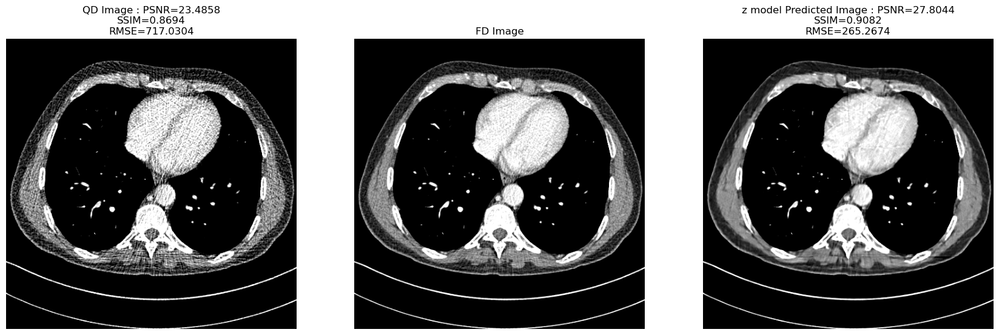

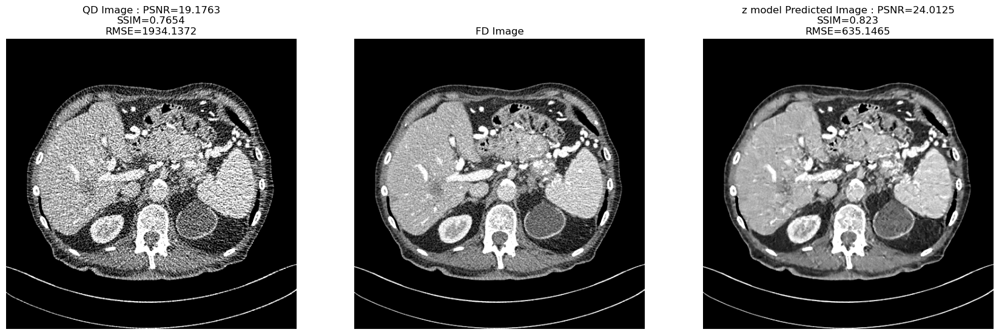

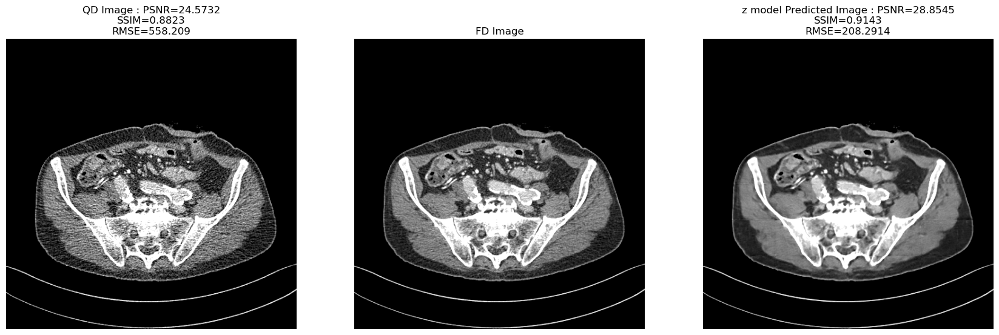

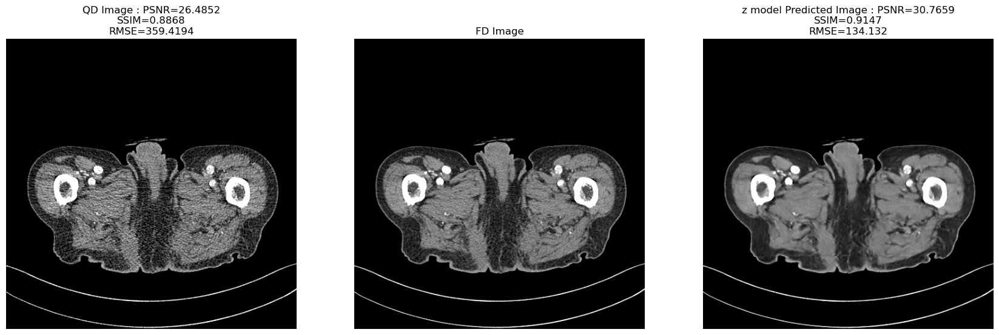

In [69]:

z_prediction_patches = []

with torch.no_grad():    
    for i, data in enumerate(noisy_image_patches_array):
        noisy = data
    
        predictions = z_model(torch.unsqueeze(torch.from_numpy(noisy.numpy()), dim=0).to('cuda')).cpu()

        z_prediction_patches.append(predictions.detach().cpu())
    
z_prediction_patches = np.concatenate(z_prediction_patches, axis=0)
z_predictions = np.expand_dims(reconstruct_image_from_patches(z_prediction_patches[0:64], 8), axis=0)


for i in range(1, int(z_prediction_patches.shape[0] / 64)): 
    reconstructed_image = reconstruct_image_from_patches(z_prediction_patches[i * 64 : i * 64 + 64], num_patches_per_row=8)
    reconstructed_image = np.expand_dims(reconstructed_image, axis=0)

    z_predictions= np.append(z_predictions, reconstructed_image, axis=0)

extended_z_prediction_patches = []

with torch.no_grad():    
    for i, data in enumerate(extended_noisy_image_patches_array):
        noisy = data
    
        predictions = z_model(torch.unsqueeze(torch.from_numpy(noisy.numpy()), dim=0).to('cuda')).cpu()

        extended_z_prediction_patches.append(predictions.detach().cpu())
    
extended_z_prediction_patches = np.concatenate(extended_z_prediction_patches, axis=0)
extended_z_predictions = np.expand_dims(reconstruct_image_from_patches(extended_z_prediction_patches[0:64], 8), axis=0)


for i in range(1, int(extended_z_prediction_patches.shape[0] / 64)): 
    reconstructed_image = reconstruct_image_from_patches(extended_z_prediction_patches[i * 64 : i * 64 + 64], num_patches_per_row=8)
    reconstructed_image = np.expand_dims(reconstructed_image, axis=0)

    pred_imfs = emd2d.emd(reconstructed_image, max_imf=-1)
    
    x = 0.5
    swaped_IMFs = np.array([noisy_imfs[1] * x + pred_imfs[1] * (1.0 - x), pred_imfs[0] * (1.0 - x) + noisy_imfs[0] * x])
    predictions = torch.from_numpy(np.expand_dims(np.expand_dims(np.sum(swaped_IMFs, axis=0), -1), 0))

    extended_z_predictions= np.append(predictions, reconstructed_image, axis=0)
visualize_predictions(z_model, noisy_array, gt_array, len(gt_array), z_predictions, "z model")


In [70]:

extended_z_metrics = get_average_metrics(extended_z_predictions, extended_gt_array, extended_noisy_array)
extended_z_metrics

Original average gt-noisy PSNR -> 23.485824280503806
Predicted average gt-predicted PSNR -> 27.804510382580283
Original average gt-noisy SSIM -> 0.8693725347221538
Predicted average gt-predicted SSIM -> 0.9081584114681859
Original average gt-noisy MSE-> 717.0303764343262
Predicted average gt-predicted MSE-> 265.25827705091274


(27.8045, 0.9082, 265.2583, 4.3187, 0.0388, -451.7721)

# Model 5 : WB Model

In [71]:

sys.path.append('../denoising-models/hformer_pytorch')
from torchinfo import summary

from w_b_model import WModel 

w_model = WModel(num_channels=8).cuda()
w_model.load_state_dict(torch.load('../denoising-models/novel_model_weights/wb_model_662.pth'))
w_model.eval()
print('model summary\n', summary(w_model, input_size=(64, 64, 64, 1)))

Using cache found in C:\Users\Tarun/.cache\torch\hub\mateuszbuda_brain-segmentation-pytorch_master
Using cache found in C:\Users\Tarun/.cache\torch\hub\mateuszbuda_brain-segmentation-pytorch_master


model summary
Layer (type:depth-idx)                   Output Shape              Param #
WModel                                   [64, 64, 64, 1]           --
├─InputProjectionLayer: 1-1              [64, 8, 64, 64]           --
│    └─Conv2d: 2-1                       [64, 8, 64, 64]           80
├─UNet: 1-2                              [64, 8, 64, 64]           --
│    └─Sequential: 2-2                   [64, 8, 64, 64]           --
│    │    └─Conv2d: 3-1                  [64, 8, 64, 64]           576
│    │    └─BatchNorm2d: 3-2             [64, 8, 64, 64]           16
│    │    └─ReLU: 3-3                    [64, 8, 64, 64]           --
│    │    └─Conv2d: 3-4                  [64, 8, 64, 64]           576
│    │    └─BatchNorm2d: 3-5             [64, 8, 64, 64]           16
│    │    └─ReLU: 3-6                    [64, 8, 64, 64]           --
│    └─MaxPool2d: 2-3                    [64, 8, 32, 32]           --
│    └─Sequential: 2-4                   [64, 16, 32, 32]          --

(512, 512)
index ::  0.1 ssim ::  0.9078889013727933
index ::  0.2 ssim ::  0.9065098677988754
index ::  0.3 ssim ::  0.903780612370774
index ::  0.4 ssim ::  0.9000732330656002
index ::  0.45 ssim ::  0.8979427735724117
index ::  0.47 ssim ::  0.897046452705326
index ::  0.49 ssim ::  0.8961368271067095
index ::  0.5 ssim ::  0.895679915660165
index ::  0.51 ssim ::  0.8952063803896396
index ::  0.55 ssim ::  0.8932928833681868
index ::  0.6 ssim ::  0.8908234572538255
index ::  0.7 ssim ::  0.8856622662466305
index ::  0.8 ssim ::  0.8803230949217111
index ::  0.9 ssim ::  0.8748812174314939
index ::  1.0 ssim ::  0.8693744246881713


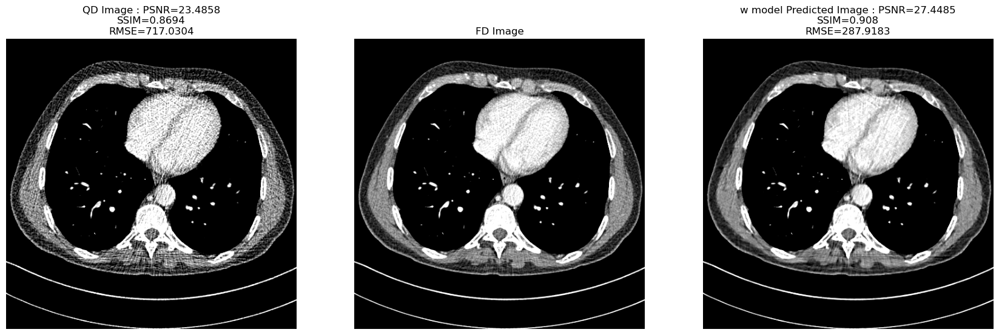

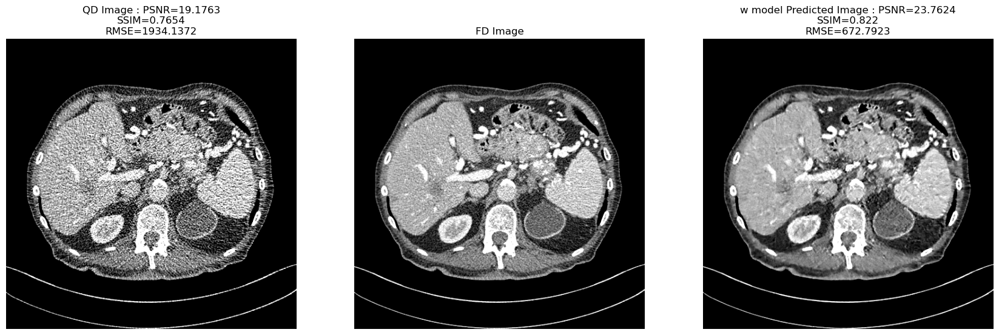

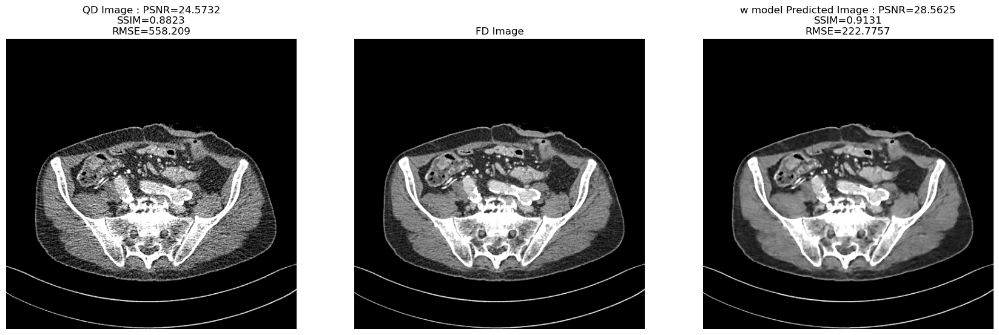

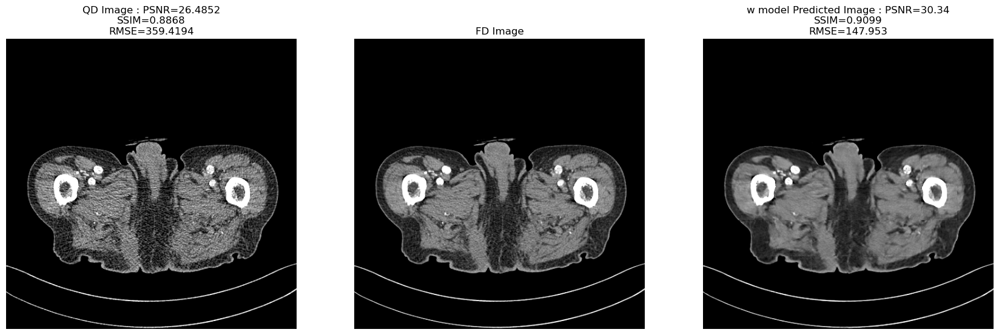

In [72]:

extended_w_prediction_patches = []

with torch.no_grad():    
    for i, data in enumerate(extended_noisy_image_patches_array):
        noisy = data
    
        predictions = w_model(torch.unsqueeze(torch.from_numpy(noisy.numpy()), dim=0).to('cuda')).cpu()

        extended_w_prediction_patches.append(predictions.detach().cpu())
    
extended_w_prediction_patches = np.concatenate(extended_w_prediction_patches, axis=0)

extended_w_predictions = np.expand_dims(reconstruct_image_from_patches(extended_w_prediction_patches[0:64], 8), axis=0)


for i in range(1, int(extended_w_prediction_patches.shape[0] / 64)): 
    reconstructed_image = reconstruct_image_from_patches(extended_w_prediction_patches[i * 64 : i * 64 + 64], num_patches_per_row=8)
    reconstructed_image = np.expand_dims(reconstructed_image, axis=0)

    extended_w_predictions= np.append(extended_w_predictions, reconstructed_image, axis=0)

# In extended_w_predictions, do EMD

emd_extended_w_predictions = [None] * extended_w_predictions.shape[0]
for i in range(extended_w_predictions.shape[0]):

    noisy_reshaped = np.squeeze(extended_noisy_array[i], -1)
    print(noisy_reshaped.shape)
    noisy_imfs = emd2d.emd(noisy_reshaped,max_imf=-1)

    pred_reshaped = extended_w_predictions[i]
    pred_reshaped = np.squeeze(pred_reshaped, axis=-1)
    pred_imfs = emd2d.emd(pred_reshaped, max_imf=-1)

    __ssim = 0
    best_performing_lerp_image = None

    for x in [0.1, 0.2, 0.3, 0.4, 0.45, 0.47, 0.49, 0.5, 0.51, 0.55, 0.6, 0.7, 0.8, 0.9, 1.0]:
        swaped_IMFs = np.array([noisy_imfs[1] * x + pred_imfs[1] * (1.0 - x), pred_imfs[0] * (1.0 - x) + noisy_imfs[0] * x])
        predictions = torch.from_numpy(np.expand_dims(np.expand_dims(np.sum(swaped_IMFs, axis=0), -1), 0))

        _ssim = calculate_ssim(trunc(denormalize(extended_gt_array[i])), trunc(denormalize(np.squeeze(predictions.detach().cpu().numpy(), axis=0))))
        print('index :: ', x, 'ssim :: ', _ssim)

        if _ssim > __ssim:
            __ssim = _ssim
            best_performing_lerp_image = predictions

    emd_extended_w_predictions[i] = best_performing_lerp_image

visualize_predictions(w_model, noisy_array, gt_array, len(gt_array), w_predictions, "w model")

In [73]:

extended_w_metrics = get_average_metrics(extended_w_predictions, extended_gt_array, extended_noisy_array)

Original average gt-noisy PSNR -> 23.485824280503806
Predicted average gt-predicted PSNR -> 27.62385663200968
Original average gt-noisy SSIM -> 0.8693725347221538
Predicted average gt-predicted SSIM -> 0.9075041419241043
Original average gt-noisy MSE-> 717.0303764343262
Predicted average gt-predicted MSE-> 276.52494807984425


In [74]:
extended_w_metrics

(27.6239, 0.9075, 276.5249, 4.138, 0.0381, -440.5054)

## Part V : Side by side comparison of all models

In [75]:
from prettytable import PrettyTable

pt = PrettyTable()
pt.field_names = ["Model", "PSNR", "SSIM", "MSE", "PSNR Improvement", "SSIM improvement", "MSE Improvement", "Num Parameter"]

#hformer_metrics = get_average_metrics(hformer_predictions, gt_array, noisy_array)
#x_metrics= get_average_metrics(np.concatenate(x_model_prediction_patches, axis=0), gt_array, noisy_array)
#y_metrics= get_average_metrics(np.concatenate(y_model_prediction_patches, axis=0), gt_array, noisy_array)
#sa_metrics = get_average_metrics(sa_predictions, gt_array, noisy_array)
#z_metrics = get_average_metrics(z_predictions, gt_array, noisy_array)
#w_metrics = get_average_metrics(w_predictions, gt_array, noisy_array)





In [76]:
hformer_metrics = extended_hformer_metrics
x_metrics = extended_x_metrics
y_metrics = extended_y_metrics
sa_metrics = extended_sa_metrics
z_metrics = extended_z_metrics
w_metrics = extended_w_metrics

pt.add_row(["Original X-y pairs (No Model)","21.97","0.78911", '-', '-', "-", "-", "-"])
pt.add_row(["Hformer",str(hformer_metrics[0]), str(hformer_metrics[1]), str(round(hformer_metrics[2], 4)), str(round(hformer_metrics[3], 4)), str(round(hformer_metrics[4] * 100, 4)), str(hformer_metrics[5]) + '%', '1,511,681'])
pt.add_row(["XB Model",str(x_metrics[0]), str(x_metrics[1]), str(round(x_metrics[2], 4)), str(round(x_metrics[3], 4)), str(round(x_metrics[4] * 100, 4)), str(x_metrics[5]) + '%', '1306'])
pt.add_row(["YB Model",str(y_metrics[0]), str(y_metrics[1]), str(round(y_metrics[2], 4)), str(round(y_metrics[3], 4)), str(round(y_metrics[4] * 100, 4)), str(y_metrics[5]) + '%', '145,453'])
pt.add_row(["SAB Model",str(sa_metrics[0]), str(sa_metrics[1]), str(round(sa_metrics[2], 4)), str(round(sa_metrics[3], 4)), str(round(sa_metrics[4] * 100, 4)), str(sa_metrics[5]) + '%', '15,345'])
pt.add_row(["ZB Model",str(z_metrics[0]), str(z_metrics[1]), str(round(z_metrics[2], 4)), str(round(z_metrics[3], 4)), str(round(z_metrics[4] * 100, 4)), str(z_metrics[5]) + '%', '245,905'])
pt.add_row(["WB Model",str(w_metrics[0]), str(w_metrics[1]), str(round(w_metrics[2], 4)), str(round(w_metrics[3], 4)), str(round(w_metrics[4] * 100, 4)), str(w_metrics[5]) + '%', '977,233'])

print(pt)

+-------------------------------+---------+---------+----------+------------------+------------------+-----------------+---------------+
|             Model             |   PSNR  |   SSIM  |   MSE    | PSNR Improvement | SSIM improvement | MSE Improvement | Num Parameter |
+-------------------------------+---------+---------+----------+------------------+------------------+-----------------+---------------+
| Original X-y pairs (No Model) |  21.97  | 0.78911 |    -     |        -         |        -         |        -        |       -       |
|            Hformer            | 27.7871 |  0.9071 | 266.3211 |      4.3013      |       3.78       |    -450.7093%   |   1,511,681   |
|            XB Model           |  24.889 |  0.8845 | 519.0645 |      1.4032      |       1.51       |    -197.9659%   |      1306     |
|            YB Model           | 26.4802 |  0.9007 | 359.8327 |      2.9944      |       3.14       |    -357.1977%   |    145,453    |
|           SAB Model           | 27.1696

## Part 6 : Output of predictions of all 4 models side by side for direct visualize comparison

In [77]:
def visualize_predictions_all_models(X_test, y_test, n, hformer_predictions, x_predictions, y_predictions, sa_predictions, z_predictions, w_predictions):
    random_numbers = list(range(n))  # not very random
    for i in random_numbers:
        noisy_image = X_test[i]
        gt_image = y_test[i]

        hformer_pred = hformer_predictions[i]
        x_pred = x_predictions[i]
        y_pred = y_predictions[i]
        sa_pred = sa_predictions[i]
        z_pred = z_predictions[i]
        w_pred = w_predictions[i]

        models = ["HFORMER", "X", "Y", "SA",  "Z", "W"]
        predictions = [hformer_pred, x_pred, y_pred, sa_pred, z_pred, w_pred]

        # Display QD and FD images
        f, axarr = plt.subplots(1, 2 + len(models), figsize=(41,41))

        psnr_qd =  calculate_psnr(trunc(denormalize(gt_image)),  trunc(denormalize(noisy_image)))
        ssim_qd =calculate_ssim(trunc(denormalize(gt_image)), trunc(denormalize(noisy_image)))
        rmse_qd = calculate_rmse(trunc(denormalize(gt_image)), trunc(denormalize(noisy_image)))

        axarr[0].imshow(trunc(denormalize(noisy_image)), cmap='gray', vmin=-160.0, vmax=240.0)
        axarr[0].set_title("QD Image\nPSNR={}\nSSIM={}\nMSE={}".format(round(psnr_qd, 4), round(ssim_qd, 4), round(rmse_qd, 4)))

        axarr[0].set_axis_off()
        axarr[1].imshow(trunc(denormalize(gt_image)), cmap='gray', vmin=-160.0, vmax=240.0)
        axarr[1].set_title("FD Image")
        axarr[1].set_axis_off()

        for j, (model_name, predicted_image) in enumerate(zip(models, predictions), start=2):
            if predicted_image.shape[-1] == 3:
                predicted_image = rgb2gray(predicted_image)

            psnr_recon = calculate_psnr(trunc(denormalize(gt_image)), trunc(denormalize(predicted_image)))
            ssim_recon = calculate_ssim(trunc(denormalize(gt_image)), trunc(denormalize(predicted_image)))
            rmse_recon = calculate_rmse(trunc(denormalize(gt_image)), trunc(denormalize(predicted_image)))

            psnr_recon = round(psnr_recon, 4)
            ssim_recon = round(ssim_recon, 4)
            mse_recon = round(rmse_recon, 4)

            axarr[j].imshow(trunc(denormalize(predicted_image)), cmap='gray', vmin=-160.0, vmax=240.0)
            axarr[j].set_title("{}\nPSNR={}\nSSIM={}\nMSE={}".format(model_name, psnr_recon, ssim_recon, mse_recon))
            axarr[j].set_axis_off()

        plt.savefig('../../output/novel_comparison_b_emd/combined_outputs_image_index_{}.png'.format(i))
        plt.show()

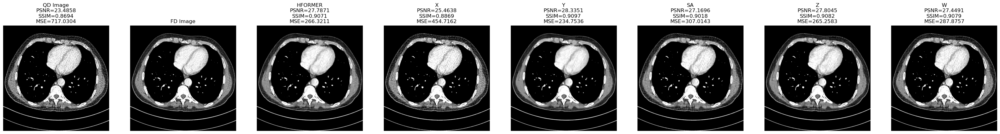

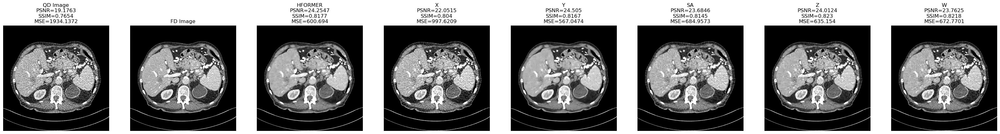

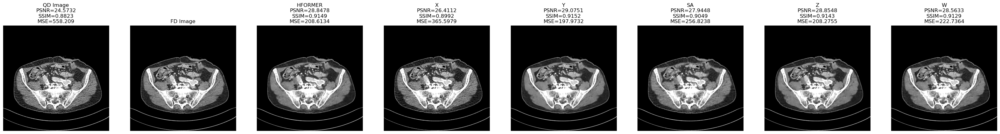

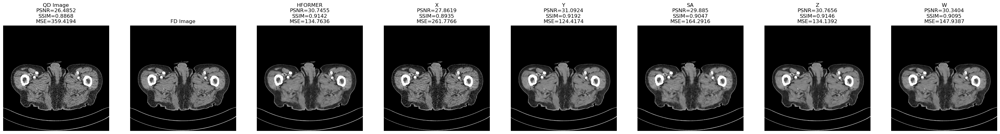

In [78]:

visualize_predictions_all_models(noisy_array, gt_array, len(gt_array), hformer_predictions, np.concatenate(x_model_prediction_patches, axis=0), np.concatenate(y_model_prediction_patches, axis=0), sa_predictions, z_predictions, w_predictions)